### Importing Necessary Libraries

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string 
import re
import nltk
nltk.download(['stopwords','wordnet', 'punkt'])
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
import warnings 
warnings.filterwarnings('ignore')
import subprocess

BOLD = '\033[1m'
RESET = '\033[0m'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [33]:
# for other theme, please run: mpl.pyplot.style.available
PLOT_PALETTE = 'tableau-colorblind10'
# for other color map, please run: mpl.pyplot.colormaps()
WORDCLOUD_COLOR_MAP = 'tab10_r'

# set palette color
plt.style.use(PLOT_PALETTE)
%matplotlib inline

### Loading Data

Data Set Link - 

In [12]:
df = pd.read_csv('Resumes.csv')

### Basic EDA

In [13]:
print(df.head())
print()
print(BOLD + "Information about the data frame:" + RESET)
print()
df.info()

         ID                                         Resume_str  \
0  16852973           HR ADMINISTRATOR/MARKETING ASSOCIATE\...   
1  22323967           HR SPECIALIST, US HR OPERATIONS      ...   
2  33176873           HR DIRECTOR       Summary      Over 2...   
3  27018550           HR SPECIALIST       Summary    Dedica...   
4  17812897           HR MANAGER         Skill Highlights  ...   

                                         Resume_html Category  
0  <div class="fontsize fontface vmargins hmargin...       HR  
1  <div class="fontsize fontface vmargins hmargin...       HR  
2  <div class="fontsize fontface vmargins hmargin...       HR  
3  <div class="fontsize fontface vmargins hmargin...       HR  
4  <div class="fontsize fontface vmargins hmargin...       HR  

Information about the data frame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  --

##### Dropped Unused columns like ID, Resume_html

In [15]:
# drop unused columns
df.pop('ID')
df.pop('Resume_html')
df

,Resume_str,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR
1,"HR SPECIALIST, US HR OPERATIONS ...",HR
2,HR DIRECTOR Summary Over 2...,HR
3,HR SPECIALIST Summary Dedica...,HR
4,HR MANAGER Skill Highlights ...,HR
...,...,...
2479,RANK: SGT/E-5 NON- COMMISSIONED OFFIC...,AVIATION
2480,"GOVERNMENT RELATIONS, COMMUNICATIONS ...",AVIATION
2481,GEEK SQUAD AGENT Professional...,AVIATION
2482,PROGRAM DIRECTOR / OFFICE MANAGER ...,AVIATION


##### Before Cleaning the resume

In [16]:
df["Resume_str"][1]

"         HR SPECIALIST, US HR OPERATIONS       Summary     Versatile  media professional with background in Communications, Marketing, Human Resources and Technology.\xa0        Experience     09/2015   to   Current     HR Specialist, US HR Operations    Company Name   －   City  ,   State       Managed communication regarding launch of Operations group, policy changes and system outages      Designed standard work and job aids to create comprehensive training program for new employees and contractors         Audited job postings for old, pending, on-hold and draft positions.           Audited union hourly, non-union hourly and salary background checks and drug screens             Conducted monthly new hire benefits briefing to new employees across all business units               Served as a link between HR Managers and vendors by handling questions and resolving system-related issues         Provide real-time process improvement feedback on key metrics and initiatives  Successfully r

#### Cleaning Resume Text

In [17]:
stemmer = nltk.stem.porter.PorterStemmer()

In [19]:
def preprocess(text):
    # Convert text to lowercase
    text = text.lower()
    
    # Remove non-english characters, punctuation, and numbers
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    # Tokenize words
    words = word_tokenize(text)
    
    # Remove stop words and apply stemming
    words = [stemmer.stem(word) for word in words if word not in stopwords.words('english')]
    
    # Additional cleaning steps
    text = ' '.join(words)
    
     # Remove punctuations, mentions, hashtags, RT and cc,  Remove URLs
    text = re.sub('http\S+\s*|RT|cc|#\S+|@\S+|[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', text)
    
     # Remove non-ASCII characters
    text = re.sub(r'[^\x00-\x7f]', ' ', text) 
    
    # Remove extra whitespace
    text = re.sub('\s+', ' ', text)  
    
    return text.strip()

"         HR SPECIALIST, US HR OPERATIONS       Summary     Versatile  media professional with background in Communications, Marketing, Human Resources and Technology.\xa0        Experience     09/2015   to   Current     HR Specialist, US HR Operations    Company Name   －   City  ,   State       Managed communication regarding launch of Operations group, policy changes and system outages      Designed standard work and job aids to create comprehensive training program for new employees and contractors         Audited job postings for old, pending, on-hold and draft positions.           Audited union hourly, non-union hourly and salary background checks and drug screens             Conducted monthly new hire benefits briefing to new employees across all business units               Served as a link between HR Managers and vendors by handling questions and resolving system-related issues         Provide real-time process improvement feedback on key metrics and initiatives  Successfully r

In [20]:
# preprocessing text
df['Resume'] = df['Resume_str'].apply(lambda w: preprocess(w))

# drop original text column
df.pop('Resume_str')

df

,Category,Resume
0,HR,hr administr market associ hr administr summar...
1,HR,hr specialist us hr oper summari versatil medi...
2,HR,hr director summari year experi recruit plu ye...
3,HR,hr specialist summari dedic driven dynam year ...
4,HR,hr manag skill highlight hr skill hr depart st...
...,...,...
2479,AVIATION,rank sgt e non commiss offic charg brigad mail...
2480,AVIATION,govern relat commun organiz develop director p...
2481,AVIATION,geek squad agent profession profil support spe...
2482,AVIATION,program director offic manag summari highli pe...


In [21]:
#After Cleaning the resume text
df["Resume"][1]

'hr specialist us hr oper summari versatil media profession background commun market human resourc technolog experi current hr specialist us hr oper compani name citi state manag commun regard launch oper group polici chang system outag design standard work job aid creat comprehens train program new employe contractor audit job post old pend hold draft posit audit union hourli non union hourli salari background check drug screen conduct monthli new hire benefit brief new employe across busi unit serv link hr manag vendor handl question resolv system relat issu provid real time process improv feedback key metric initi su ess brand us hr oper sharepoint site busi unit project manag rfi rfp background check drug screen vendor market commun co op compani name citi state post new articl chang updat corpor sharepoint site includ graphic visual commun research draft articl featur stori promot compani activ program co edit develop content quarterli publish newslett provid commun support intern

# Advanced EDA & Visualizations

In [27]:
# create list of all categories
categories = np.sort(df['Category'].unique())
categories

array(['ACCOUNTANT', 'ADVOCATE', 'AGRICULTURE', 'APPAREL', 'ARTS',
       'AUTOMOBILE', 'AVIATION', 'BANKING', 'BPO', 'BUSINESS-DEVELOPMENT',
       'CHEF', 'CONSTRUCTION', 'CONSULTANT', 'DESIGNER', 'DIGITAL-MEDIA',
       'ENGINEERING', 'FINANCE', 'FITNESS', 'HEALTHCARE', 'HR',
       'INFORMATION-TECHNOLOGY', 'PUBLIC-RELATIONS', 'SALES', 'TEACHER'],
      dtype=object)

##### Distribution of Resume Categories

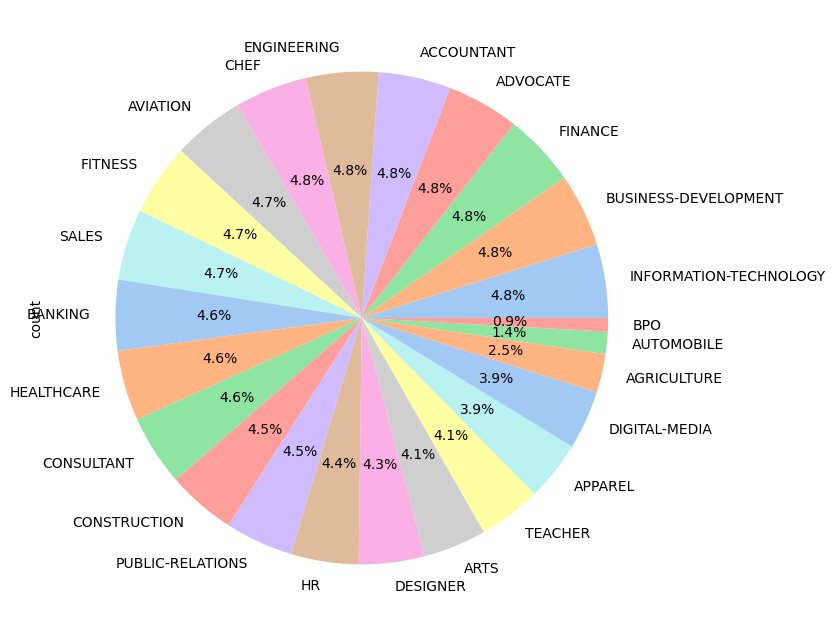

In [25]:
# Define a custom color palette
custom_palette = sns.color_palette("pastel")

# Plot the pie chart with the custom color palette
plt.figure(figsize=(8, 8))
df['Category'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=custom_palette)
plt.xticks(rotation=90)
plt.show()

In [26]:
df['Category'].value_counts()

Category
INFORMATION-TECHNOLOGY    120
BUSINESS-DEVELOPMENT      120
FINANCE                   118
ADVOCATE                  118
ACCOUNTANT                118
ENGINEERING               118
CHEF                      118
AVIATION                  117
FITNESS                   117
SALES                     116
BANKING                   115
HEALTHCARE                115
CONSULTANT                115
CONSTRUCTION              112
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  107
ARTS                      103
TEACHER                   102
APPAREL                    97
DIGITAL-MEDIA              96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: count, dtype: int64

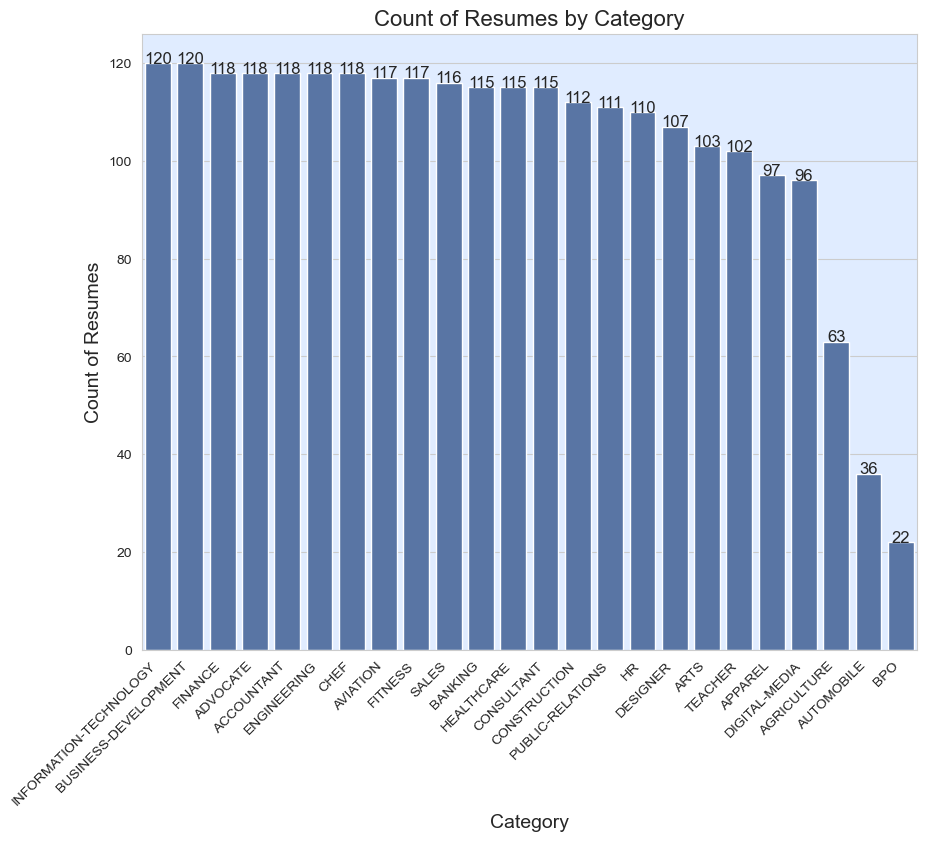

In [48]:

# Set the style and background color
sns.set_style("whitegrid", {"axes.facecolor": "#E0ECFF"})  # Light blue background color

# Create a figure and axis objects
plt.figure(figsize=(10, 8))

# Define a standard blue color for the bars
standard_blue = "#4C72B0"

# Plot a vertical bar chart with the standard blue color
sns.countplot(x="Category", data=df, color=standard_blue, order=df['Category'].value_counts().index)

# Add labels and title
plt.xlabel("Category", fontsize=14)
plt.ylabel("Count of Resumes", fontsize=14)
plt.title("Count of Resumes by Category", fontsize=16)

# Add annotations
for index, value in enumerate(df['Category'].value_counts()):
    plt.text(index, value, str(value), fontsize=12, ha='center')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# Show plot
plt.show()


### Word Map for Job categories

In [31]:
def wordcloud(df):
    txt = ' '.join(txt for txt in df['Resume'])
    wordcloud = WordCloud(
        height=2000,
        width=4000,
        colormap=WORDCLOUD_COLOR_MAP
    ).generate(txt)

    return wordcloud

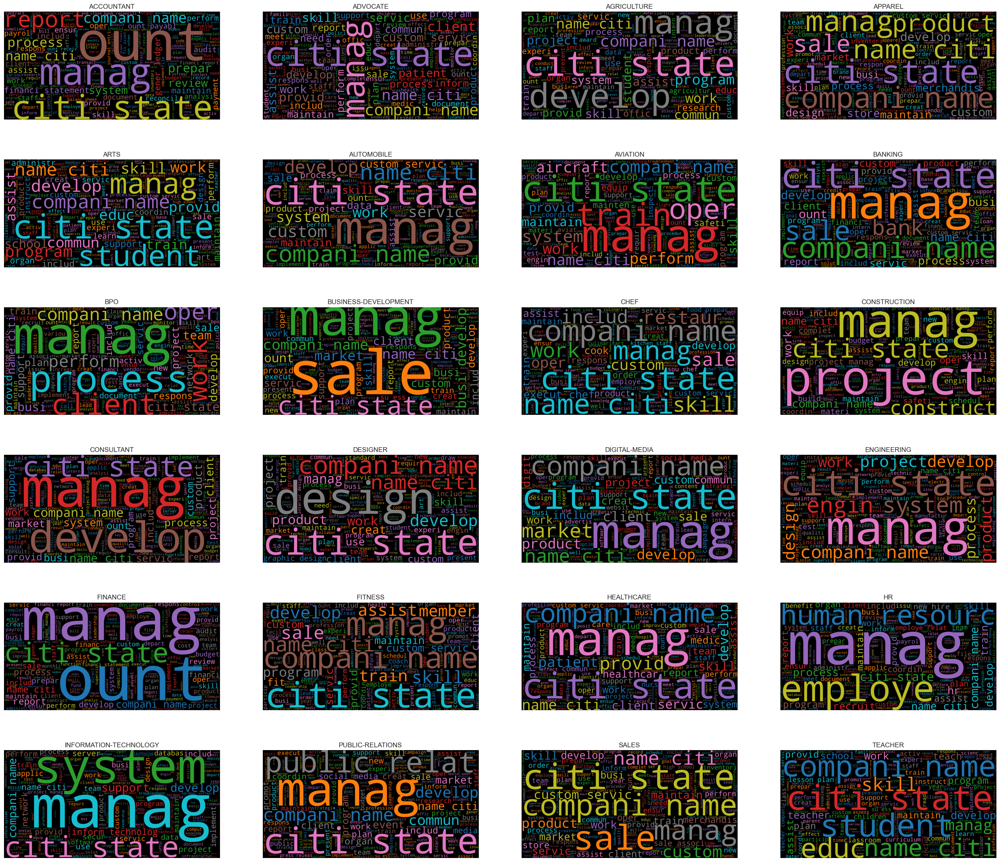

In [34]:
plt.figure(figsize=(32, 28))

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(6, 4, i + 1).set_title(category)
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

 ##### Removing most commonly used words for model building

In [50]:
del_words = ['name', 'city', 'state', 'country', 'fullname', 'company', 'resume', 'curriculum vitae', 'address', 'phone',
             'email', 'linkedin', 'profile', 'summary', 'objective', 'experience', 'education', 'skill', 'skills',
             'reference', 'references', 'contact', 'detail', 'details', 'mail', 'gmail', 'yahoo', 'hotmail', 'mailing',
             'linkedin', 'twitter', 'facebook', 'instagram', 'website', 'web', 'url', 'www', 'year']

##### Term Frequency

In [52]:
word_freq_fist = nltk.FreqDist(total_words)
most_freq = word_freq_fist.most_common(50)
print(most_freq)

[('manag', 24408), ('compani', 15723), ('citi', 15128), ('develop', 12127), ('custom', 11777), ('servic', 9241), ('work', 8875), ('ount', 8666), ('sale', 8553), ('busi', 8175), ('project', 8073), ('product', 7516), ('train', 7284), ('system', 7266), ('team', 7156), ('process', 6916), ('commun', 6893), ('plan', 6524), ('client', 6516), ('new', 6410), ('market', 6253), ('report', 6206), ('provid', 6169), ('oper', 6152), ('includ', 6129), ('design', 6102), ('assist', 6066), ('maintain', 6005), ('experi', 5853), ('program', 5562), ('perform', 5441), ('support', 5147), ('offic', 5125), ('educ', 5111), ('inform', 4885), ('prepar', 4594), ('use', 4470), ('implement', 4436), ('respons', 4393), ('employe', 4391), ('profession', 4384), ('financi', 4363), ('administr', 4015), ('staff', 3977), ('time', 3968), ('creat', 3967), ('ensur', 3939), ('excel', 3817), ('data', 3797), ('organ', 3766)]


In [51]:
stop_words = set(stopwords.words('english')+['``',"''"]+del_words)
total_words = []
sentences = df['Resume'].values
cleaned_sentences = ""
for sentence in sentences:
    cleaned_sentences += sentence
    required_words = nltk.word_tokenize(sentence)
    for word in required_words:
        if word not in stop_words and word not in string.punctuation:
            total_words.append(word)

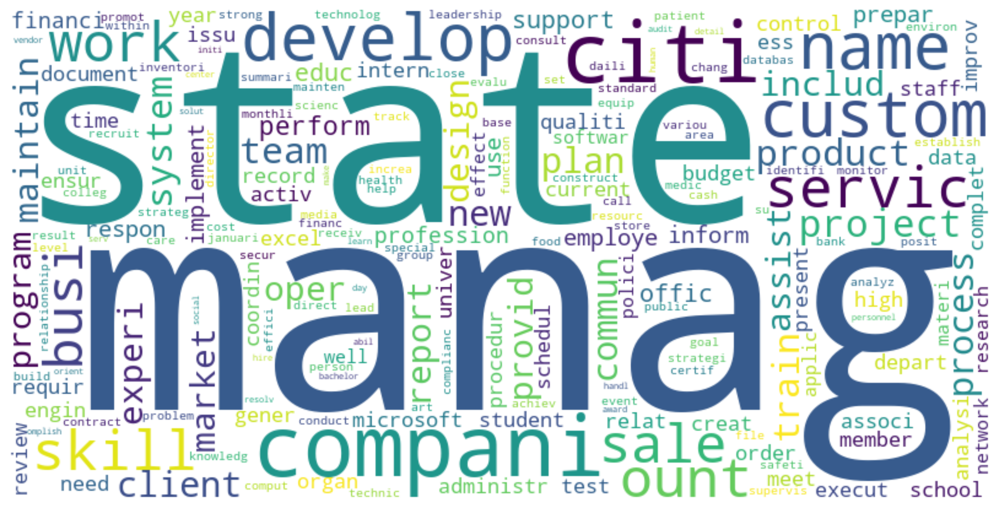

In [53]:
wc = WordCloud(collocations=False, width=800, height=400, background_color='white').generate(cleaned_sentences)
plt.figure(figsize=(12,6), dpi=300)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()

### Term frequency for Job categories 

In [54]:
def wordfreq(df):
    count = df['Resume'].str.split(expand=True).stack().value_counts().reset_index()
    count.columns = ['Word', 'Frequency']
    return count.head(10)

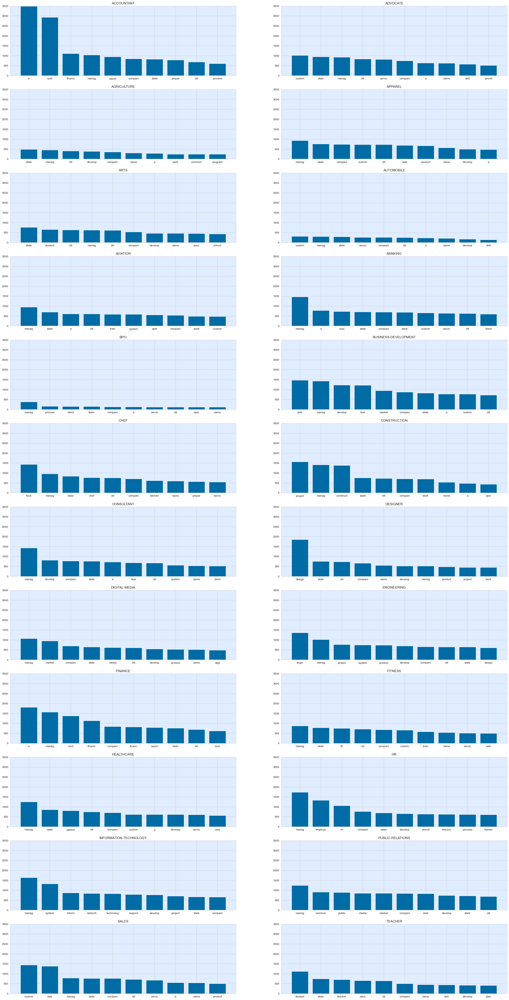

In [55]:
fig = plt.figure(figsize=(32, 64))

for i, category in enumerate(categories):
    wf = wordfreq(df_categories[i])

    fig.add_subplot(12, 2, i + 1).set_title(category)
    plt.bar(wf['Word'], wf['Frequency'])
    plt.ylim(0, 3500)

plt.show()
plt.close()

In [ ]:
Models:   (Kowshik)

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Assuming you have a DataFrame 'resume_df' with extracted resume data
# and 'job_description' as the input job description

job_description="""Position type: Full-time -- Contract

Location: Hybrid - Midtown, NY

No Corp to Corp. W2 contractors only please.

 
As a Python Developer, you will:
 
This role is responsible for developing and delivering complex requirements to accomplish business goals. Key responsibilities of
the role include ensuring that software is developed to meet functional, non functional, and compliance requirements. This role
codes solutions, unit tests, and ensures the solution can be integrated successfully into the overall application/system with clear,
robust and well tested interfaces. They are familiar with development and testing practices of the bank.
¿Contribute to story refinement/defining requirements.
¿Participate and guide team in estimating work necessary to realize a story/requirement through
the delivery lifecycle.
¿Perform spike/proof of concept as necessary to mitigate risk or implement new ideas.
¿Code solutions and unit test to deliver a requirement/story per the defined acceptance criteria
and compliance requirements.
¿Utilize multiple architectural components (across data, application, business) in design and
development of client requirements.
¿Assist team with resolving technical complexities involved in realizing story work.
¿Contribute to existing test suites (integration, regression, performance), a nalyze test reports, identify
any test issues/errors, and triage the underlying cause.
¿Document and communicate required information for deployment, maintenance, support, and
business functionality.
¿Participate, contribute and can coach team members in the delivery/release (CI CD) events. e.g.
branching timelines, pull requests, issue triage, merge/conflict resolution, release notes.
 
Qualified candidates should APPLY NOW for immediate consideration! Please hit APPLY to provide the required information, and we will be back in touch as soon as possible.
 
We are currently interviewing to fill this and other similar positions. If this role is not a fit for you, we do offer a referral bonus program for referrals that we successfully place with our clients, subject to program guidelines. ASK ME HOW.

 
PAY RANGE AND BENEFITS:

Pay Range*: $70- $73 per hour on W2

 
*Pay range offered to a successful candidate will be based on several factors, including the candidate's education, work experience, work location, specific job duties, certifications, etc.
 
Benefits: Innova Solutions offers benefits(based on eligibility) that include the following: Medical & pharmacy coverage, Dental/vision insurance, 401(k), Health saving account (HSA) and Flexible spending account (FSA), Life Insurance, Pet Insurance, Short term and Long term Disability, Accident & Critical illness coverage, Pre-paid legal & ID theft protection, Sick time, and other types of paid leaves (as required by law), Employee Assistance Program (EAP).
 
ABOUT INNOVA SOLUTIONS: Founded in 1998 and headquartered in Atlanta, Georgia, Innova Solutions employs approximately 50,000 professionals worldwide and reports an annual revenue approaching $3 Billion. Through our global delivery centers across North America, Asia, and Europe, we deliver strategic technology and business transformation solutions to our clients, enabling them to operate as leaders within their fields.
 
Recent Recognitions:

One of Largest IT Consulting Staffing firms in the USA - Recognized as #4 by Staffing Industry Analysts (SIA 2022)
ClearlyRated® Client Diamond Award Winner (2020)
One of the Largest Certified MBE Companies in the NMSDC Network (2022)
Advanced Tier Services partner with AWS and Gold with MS"""


# Tokenize and preprocess the job description
vectorizer = TfidfVectorizer(stop_words='english')
job_desc_vector = vectorizer.fit_transform([job_description])

# Calculate cosine similarity between job description and resumes
resume_scores = []
for resume_text in df['Resume']:
    resume_vector = vectorizer.transform([resume_text])
    similarity_score = cosine_similarity(job_desc_vector, resume_vector)[0][0]
    resume_scores.append(similarity_score)

# Add matching scores to the resume DataFrame
df['matching_score'] = resume_scores

# Sort resumes by matching score
sorted_resumes = df.sort_values(by='matching_score', ascending=False)

# Display top matching resumes
print(sorted_resumes.head())


In [ ]:
sorted_resumes[sorted_resumes['matching_score']>0.30]

In [ ]:
!pip install PyPDF2

In [ ]:
resume_df=df

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from collections import Counter

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from PyPDF2 import PdfReader


# Function to extract text from PDF
def extract_text_from_pdf(pdf_path):
    with open(pdf_path, 'rb') as file:
        reader = PdfReader(file)
        resume_text = ''
        for page in reader.pages:
            resume_text += page.extract_text()
    return resume_text

# Assuming you have a DataFrame 'resume_df' with extracted resume data
# and 'job_description' as the text of the job description

# Receive category input
selected_category = input("Enter the category: ")

# Receive job description input
job_description = input("Enter the job description: ")

# Receive resume upload
resume_path = input("Upload your resume (PDF): ")

# Extract text from the uploaded PDF resume
uploaded_resume_text = extract_text_from_pdf(resume_path)
#print(uploaded_resume_text)
# Extract main keywords from DataFrame for the specified category
# Initialize NLTK resources
#nltk.download('punkt')
#nltk.download('stopwords')

# Tokenize, remove stop words, and perform stemming
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

# Selected category
#selected_category = "HR"  # Change this to your desired category

# Filter resumes for the selected category
category_resumes = resume_df[resume_df['Category'] == selected_category]
# Tokenize and process each resume in the selected category
all_words = []
for resume_text in category_resumes['Resume']:
    # Tokenize the text
    words = word_tokenize(resume_text.lower())
    # Remove stop words and perform stemming
    words = [stemmer.stem(word) for word in words if word.isalnum() and word not in stop_words]
    all_words.extend(words)

# Count the frequency of each word
word_freq = Counter(all_words)

# Get the top 10 keywords based on frequency
top_keywords = [keyword for keyword, _ in word_freq.most_common(100000)]  # Change 10 to the desired number of keywords

#print("Top keywords in the HR category:")
#for keyword in top_keywords:
    #print(keyword)
'''   
#Tokenize the uploaded resume
vectorizer = CountVectorizer(stop_words='english')
#uploaded_resume_vector = vectorizer.fit_transform([job_description])

# Tokenize the job description
job_description_vector = vectorizer.transform([job_description])


# Get feature names from CountVectorizer
job_description_keywords = list(job_description_vector.vocabulary_.keys())
print(job_description_keywords)
'''

#job_description_keywords = word_tokenize(job_description.lower())
job_description=preprocess(job_description)
resume_data=preprocess(uploaded_resume_text)
vectorizer = CountVectorizer(stop_words='english')





uploaded_resume_vector = vectorizer.fit_transform([resume_data])

# Tokenize the job description
job_description_vector = vectorizer.fit_transform([job_description])


# Get feature names from CountVectorizer
job_description_keywords = job_description_vector.get_feature_names_out().tolist()
resume_keywords = uploaded_resume_vector.get_feature_names_out().tolist()
#print(job_description_keywords)
# Remove stop words and perform stemming
words = [stemmer.stem(word) for word in words if word.isalnum() and word not in stop_words]


# Check presence of main keywords in job description
matching_keywords = [keyword for keyword in resume_keywords if keyword in job_description_keywords]
matching_score = len(matching_keywords) / len(resume_keywords)

# Display matching score
print("Matching Score:", matching_score)


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from PyPDF2 import PdfReader
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from collections import Counter
import string
import nltk
nltk.download('punkt')
nltk.download('stopwords')

# Function to preprocess text
def preprocess(text):
    # Tokenize text
    tokens = nltk.word_tokenize(text.lower())
    # Remove punctuation and stop words, and perform stemming
    stop_words = set(stopwords.words('english'))
    punctuation = set(string.punctuation)
    stemmer = PorterStemmer()
    processed_tokens = [stemmer.stem(token) for token in tokens if token.isalnum() and token not in stop_words and token not in punctuation]
    return ' '.join(processed_tokens)

# Function to extract text from PDF
def extract_text_from_pdf(pdf_path):
    with open(pdf_path, 'rb') as file:
        reader = PdfReader(file)
        resume_text = ''
        for page in reader.pages:
            resume_text += page.extract_text()
    return resume_text

# Receive category input
selected_category = input("Enter the category: ")

# Receive job description input
job_description = input("Enter the job description: ")

# Receive resume upload
resume_path = input("Upload your resume (PDF): ")

# Extract text from the uploaded PDF resume
uploaded_resume_text = extract_text_from_pdf(resume_path)

# Preprocess job description and uploaded resume text
job_description = preprocess(job_description)
uploaded_resume_text = preprocess(uploaded_resume_text)

# Tokenize and vectorize the job description and uploaded resume text
vectorizer = CountVectorizer(stop_words='english')
job_description_vector = vectorizer.fit_transform([job_description])
uploaded_resume_vector = vectorizer.transform([uploaded_resume_text])

# Get feature names from CountVectorizer
job_description_keywords = vectorizer.get_feature_names_out()
resume_keywords = vectorizer.get_feature_names_out()

# Convert feature names to lists
job_description_keywords = job_description_keywords.tolist()
resume_keywords = resume_keywords.tolist()

# Check presence of main keywords in both job description and uploaded resume
matching_keywords = [keyword for keyword in resume_keywords if keyword in job_description_keywords]
matching_score = len(matching_keywords) / len(resume_keywords)

# Display matching score
print("Matching Score:", matching_score)


In [ ]:
**HR Specialist Position:**
Seeking an experienced HR Specialist proficient in HRIS management, performance evaluation, and analytics. Must excel in project management, possess strong organizational development skills, and be adept with tools like 15Five, Paychex, Gusto, Glint, and Power BI.

# Spacy

In [61]:
import spacy

# Check if spaCy model is available
try:
    # Attempt to load the spaCy model
    nlp = spacy.load("en_core_web_lg")
    print("spaCy model 'en_core_web_lg' is already available.")
except OSError:
    # If spaCy model is not available, download it
    print("Downloading spaCy model 'en_core_web_lg'...")
    subprocess.call(["python", "-m", "spacy", "download", "en_core_web_lg"])
    print("spaCy model 'en_core_web_lg' downloaded successfully.")

    # Load the downloaded model
    nlp = spacy.load("en_core_web_lg")

# Now, you can proceed with your code
skill_pattern_path = "jz_skill_patterns.jsonl"


spaCy model 'en_core_web_lg' downloaded successfully.


In [62]:
ruler = nlp.add_pipe("entity_ruler")
ruler.from_disk(skill_pattern_path)
nlp.pipe_names

['tok2vec',
 'tagger',
 'parser',
 'attribute_ruler',
 'lemmatizer',
 'ner',
 'entity_ruler']

In [63]:
def get_skills(text):
    doc = nlp(text)
    myset = []
    subset = []
    for ent in doc.ents:
        if ent.label_ == "SKILL":
            subset.append(ent.text)
    myset.append(subset)
    return subset


def unique_skills(x):
    return list(set(x))


def get_skills(text):
    # Process the text with spaCy
    doc = nlp(text)
    
    # Initialize a list to store skills
    skills = []
    
    # Loop through named entities in the document
    for ent in doc.ents:
        # Check if the entity is labeled as a skill
        if ent.label_ == "SKILL":
            # Add the skill text to the list
            skills.append(ent.text)
    
    # Return the list of skills
    return skills


def unique_skills(skills):
    unique_skills = list(set(skills))
    return unique_skills


In [66]:
df["skills"] = df["Resume"].str.lower().apply(get_skills)
df["skills"] = df["skills"].apply(unique_skills)

KeyboardInterrupt: 

In [70]:
Job_cat = df["Category"].unique()
Job_cat = np.append(Job_cat, "ALL")

In [71]:
Total_skills = []
if Job_Category != "ALL":
    fltr = data[data["Category"] == Job_Category]["skills"]
    for x in fltr:
        for i in x:
            Total_skills.append(i)
else:
    fltr = data["skills"]
    for x in fltr:
        for i in x:
            Total_skills.append(i)

fig = px.histogram(
    x=Total_skills,
    labels={"x": "Skills"},
    title=f"{Job_Category} Distribution of Skills",
).update_xaxes(categoryorder="total descending")
fig.show()

NameError: name 'Job_Category' is not defined